## Rental Vacancy Rates - Exploratory Data Analysis

### Goal: 
Explore the data relationships of all your features and understand how the features compare to the response variable.

    ● Build data profiles and tables
        ○ Inferential statistics
    ● Explore data relationships
        ○ Data visualization
    ● Feature Selection and Engineering

In [1]:
#Import pandas, matplotlib.pyplot, and seaborn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import scipy.stats as ss
from pandas_profiling import ProfileReport
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [2]:
#get path to data
path= '/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_2/data/interim'
os.chdir(path)
os.getcwd()

'/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_2/data/interim'

In [3]:
os.listdir()

['.gitkeep',
 '.ipynb_checkpoints',
 'ACS_rentsPrices_2011_2018.csv',
 'ACS_zillow_2011_2018.csv',
 'Annual_fredData_2011_2019',
 'df3_1956',
 'df_homePrices_2011_2018',
 'df_homePrices_2011_2020',
 'df_homePrices_2011_2020.csv',
 'df_rentPrices_2014_2020',
 'df_rentPrices_2014_2020.csv',
 'master_complete_for_EDA.csv',
 'vacancy_zillowHomeRent_merge_2014_2020.csv',
 'VacancyRate_Zipcode_2011_2018',
 'VacancyRate_Zipcode_2011_2018.csv',
 'VacancyRate_Zipcode_AND_National_2011_2020.csv',
 'zillow_rentPrices_2014_2020.csv']

In [4]:
# load cleaned data, starting from 1956
df = pd.read_csv('df3_1956')
df.head()

,DATE,uspop_growth,med_hIncome,rentl_vacnyRate,unemplt_rate,int_rate,cpi_rent,homePrice_index,newHouse_starts,ppi_resConstruct,resConstruct_spending
0,1956-01-01,NaN,NaN,6.2,4.0,2.50,35.9,NaN,NaN,NaN,NaN
1,1956-02-01,NaN,NaN,6.2,3.9,2.50,35.9,NaN,NaN,NaN,NaN
2,1956-03-01,NaN,NaN,6.2,4.2,2.50,35.9,NaN,NaN,NaN,NaN
3,1956-04-01,NaN,NaN,5.9,4.0,2.65,36.0,NaN,NaN,NaN,NaN
4,1956-05-01,NaN,NaN,5.9,4.3,2.75,36.1,NaN,NaN,NaN,NaN


### Build data profiles and tables

#### Inferential statistics

Hint: do any particular results in your data strike you as abnormal?

- **There is very little correlation between rental vacany rate and unemployment, which I found surprising.**
 - **As new housing starts and contruction spending are negatively correlated with vacancy rates, I would have thought differently. Possibly if the economy is good and there is more construction and home building**

What hypotheses can you form (Null and Alternative hypotheses) which you could go on to test? 

 - **Null hypotheses: rental vacany rates ARE NOT correlated with medium household income (positive), interest rates (negative), or cpi rent (positive).... And can therefore not be used to model future rental vacany rates.**
 
 -**Alternative hyptotheses: rental vacany rates ARE correlated with medium household income (positive), interest rates (negative), or cpi rent (positive).... And can therefore be used to model future rental vacany rates**

Take some time to recall your statistical concepts, such as that the p-value of an observation is the probability of seeing data at least as extreme as that observation, on the assumption of the null hypothesis.

In [5]:
profile = ProfileReport(df)
profile

In [6]:
#save pandas profiling report as html
os.chdir('/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_2/reports')
profile.to_file("NATL_FRED_EDA.html")

### Explore data relationships - see Pandas Profile above

#### Data visualization 

Hint: recall your matplotlib and seaborn functions for data visualization: 

matplotlib: plt.plot(), plt.xlabel(), plt.show(), plt.hist(),

Seaborn: sns.relplot(), sns.lmplot(), sns.catplot().

Remember to always start with an idea of what you want to achieve, and use these
libraries and their functions as your toolkit to make that idea a reality.

### Feature Selection and Engineering

Hint: feature selection is where data storytelling starts: we tell a story as soon as we include certain features and omit others. But how we manipulate - or engineer - those fields is just as important. Recall the crucial elements to
feature engineering:
- If you have categorical features, you might need to one-hot encode them
- You may need to binarize your columns and bin your values.
- To handle missing data, think about how appropriate the methods of listwise deletion, data imputation, replacing missing values with constants or simply attempting to find the missing values are for your data.
    - **how to handle missing data from variables that start in the 1980s or 2000s?**
    - **when making a model I may consider dropping columns with missing data (ie. drop homeprice_index, ppi_resConstruct may be dropped due to high correlation with cpi_rent), or by keeping med houselehold income and only create the model off that slice of dates.**

- Think about whether you need to standardize, log-transform or normalize your data, as well as statistically valid ways to remove outliers.
    - **I will need to normalize the data as there are some variables that are percents and then other that are prices in large amounts**

#### Scale the Data

In [7]:
#Create a new dataframe, setting the index to 'DATE'
df_scale = df.set_index('DATE')
#Save the DATE labels 
df_index = df_scale.index
#Save the column names
df_columns = df_scale.columns
df_scale.head()

,uspop_growth,med_hIncome,rentl_vacnyRate,unemplt_rate,int_rate,cpi_rent,homePrice_index,newHouse_starts,ppi_resConstruct,resConstruct_spending
DATE,,,,,,,,,,
1956-01-01,NaN,NaN,6.2,4.0,2.50,35.9,NaN,NaN,NaN,NaN
1956-02-01,NaN,NaN,6.2,3.9,2.50,35.9,NaN,NaN,NaN,NaN
1956-03-01,NaN,NaN,6.2,4.2,2.50,35.9,NaN,NaN,NaN,NaN
1956-04-01,NaN,NaN,5.9,4.0,2.65,36.0,NaN,NaN,NaN,NaN
1956-05-01,NaN,NaN,5.9,4.3,2.75,36.1,NaN,NaN,NaN,NaN


In [8]:
df_scale = scale(df_scale)

In [9]:
#Code task 2#
#Create a new dataframe and reintroduce the column names
df_scaled_df = pd.DataFrame(df_scale, columns=df_columns)
df_scaled_df.head()

,uspop_growth,med_hIncome,rentl_vacnyRate,unemplt_rate,int_rate,cpi_rent,homePrice_index,newHouse_starts,ppi_resConstruct,resConstruct_spending
0,NaN,NaN,-0.755838,-1.167079,-0.736433,-1.144418,NaN,NaN,NaN,NaN
1,NaN,NaN,-0.755838,-1.227202,-0.736433,-1.144418,NaN,NaN,NaN,NaN
2,NaN,NaN,-0.755838,-1.046834,-0.736433,-1.144418,NaN,NaN,NaN,NaN
3,NaN,NaN,-0.955194,-1.167079,-0.683302,-1.143312,NaN,NaN,NaN,NaN
4,NaN,NaN,-0.955194,-0.986711,-0.647882,-1.142206,NaN,NaN,NaN,NaN


#### Verifying the scaling

In [10]:
df_scaled_df.mean()

uspop_growth            -1.350280e-15
med_hIncome             -5.085879e-16
rentl_vacnyRate          8.595275e-16
unemplt_rate            -7.403397e-16
int_rate                 1.416501e-15
cpi_rent                 1.306482e-16
homePrice_index          3.767025e-16
newHouse_starts          7.053447e-17
ppi_resConstruct         7.804056e-16
resConstruct_spending   -1.375276e-16
dtype: float64

In [11]:
df_scaled_df.std(ddof=0)

uspop_growth             1.0
med_hIncome              1.0
rentl_vacnyRate          1.0
unemplt_rate             1.0
int_rate                 1.0
cpi_rent                 1.0
homePrice_index          1.0
newHouse_starts          1.0
ppi_resConstruct         1.0
resConstruct_spending    1.0
dtype: float64

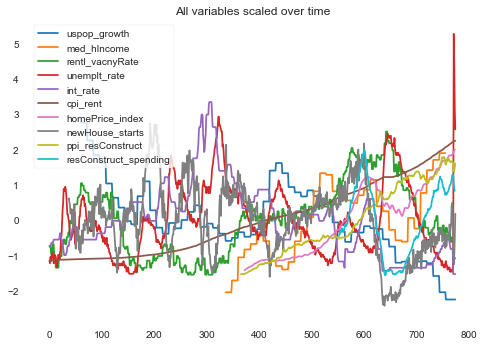

In [12]:
#plot the scaled data
_ = plt.plot(df_scaled_df)
_ = plt.title('All variables scaled over time')
_ = plt.legend(df_columns)
plt.show()

In [13]:
def ecdf(data):
    """Compute ECDF for a one-dimensional array of measurements."""
    # Number of data points: n
    n = len(data)

    # x-data for the ECDF: x
    x = np.sort(data)

    # y-data for the ECDF: y
    y = np.arange(1, n+1) / n

    return x, y

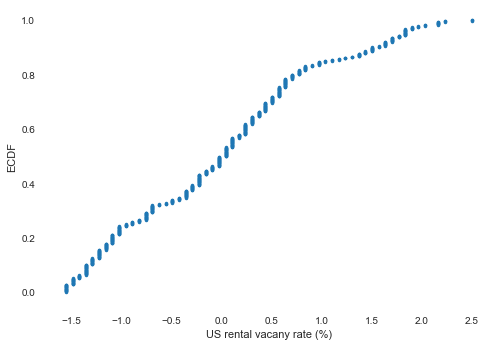

In [14]:
# Compute ECDF for rental vacancy data: x_rvcnt, y_rvcnt
x_rvcnt, y_rvcnt = ecdf(df_scaled_df['rentl_vacnyRate'])

# Generate plot
_ = plt.plot(x_rvcnt, y_rvcnt, marker='.', linestyle='none')

# Label the axes
_ = plt.xlabel('US rental vacany rate (%)')
_ = plt.ylabel('ECDF')

# Display the plot
plt.show()

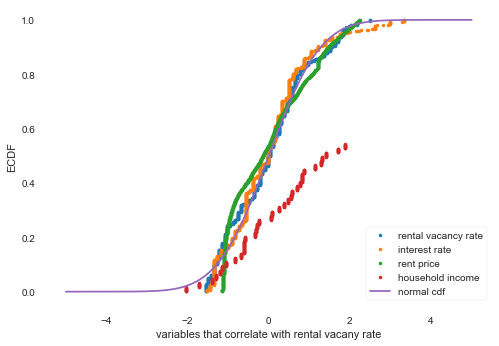

In [15]:
#compute normal CDF
x = np.linspace(-5, 5, 5000)
mu = 0
sigma = 1

y_cdf = ss.norm.cdf(x, mu, sigma) # the normal cdf

# Compute ECDFs for data correlated with rental vacany rate
x_incm, y_incm = ecdf(df_scaled_df['med_hIncome']) 
x_intRt, y_intRt = ecdf(df_scaled_df['int_rate'])
x_rent, y_rent = ecdf(df_scaled_df['cpi_rent'])
x_incm, y_incm = ecdf(df_scaled_df['med_hIncome'])

# Plot all ECDFs on the same plot
_ = plt.plot(x_rvcnt, y_rvcnt, marker='.', linestyle='none')
_ = plt.plot(x_intRt, y_intRt, marker='.', linestyle='none')
_ = plt.plot(x_rent, y_rent, marker='.', linestyle='none')
_ = plt.plot(x_incm, y_incm, marker='.', linestyle='none')
_ = plt.plot(x, y_cdf)

# Annotate the plot
plt.legend(('rental vacancy rate', 'interest rate', 'rent price', 'household income', 'normal cdf'), loc='lower right')
_ = plt.xlabel('variables that correlate with rental vacany rate')
_ = plt.ylabel('ECDF')

# Display the plot
plt.show()

### Reflection 
*Consider the following questions and use your understanding of your dataset to answer
them:*

● Are there variables that are particularly significant in terms of explaining the answer to your project question?
    
   - **variables that have stronger correlations with rental vacany rate:**
        - medium household income (positive)
        - interest rates (negative)
        - cpi rent (positive)
        
   - **may be able to drop home prices and ppi residentila contruction costs as they are highly correlated with cpi_rent which is the strongest correlated variable with rental vacany rates.**
    
  - **rental vacancy rates seem to have more of a "sideways" quadratic correlation with cpi_rent and home prices vs. a pure linear correlation.**

● Are there significant differences between subgroups in your data that may be relevant to your project aim?
    
   - **different variables have different scales (some percents, some in millions of dollars)**

● Are there strong correlations between pairs of independent variables or between an independent and a dependent variable?
   - **strong correlations 'cpi_rent' positively correlated with 'homePrice_index' and 'ppi_resConstruct'**
    - 'cpi_rent' negatively correlated with 'uspop_growth'
    - 'uspop_growth negatively correlated with 'homePrice_index', 'cpi_rent' and 'ppi_resConstruct'
    - 'unemplt_rate' negatively correlated with 'resConstruct_spending'
    - 'int_rate' negatively correlated with 'ppi_resConstruct'
    - 'restConstruct_spending' positively correlated wtih 'newHouse_starts', 'homePrice_index', 'int_rate', and 'med_hincome'
  
    
● What are the most appropriate tests to use to analyze these relationships?

  - **logistic regression? random forest, xgboost, Polynomial regression, ridge regression, lasso regression, ElasticNet regression, possibly stepwise regression?**

### Potential Next Steps

- for model drop highly correlated independent variables (homeprice_index, ppi_resConstruct)
- deal with missing data (see above ideas in feature engineering section.

IF NEEDED COULD:
- get **inflation rates** and add to data
- get GDP and add to the data
- get indicators of economic growth, recession: ie. national income, spending, and output

See website <https://smartasset.com/investing/indicator-definition>

- **Gross Domestic Product (GDP)**
- **The Stock Market.**
- xUnemployment.
- Consumer Price Index (CPI)
- Producer Price Index (PPI)
- Balance of Trade.
- xHousing Starts.
- xInterest Rates.
- Currency Strength
- Manufacturing Activity
- xIncome and Wages
- Consumer Spending 

-get indicators of housing market
<https://www.investopedia.com/articles/personal-finance/033015/top-us-housing-market-indicators.asp>

    eight important economic indicators related to the housing market.
    xConstruction Spending. ...
    residential contruction.. 
    **Home Sales**
    State-level Home Sales Reports. ...
    New Home Sales. ...
    Pending Sales. ...
    NAHB's Housing Market Index. ...
    Regional Price Indices. ...
